In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import os, glob
import numpy as np
import pandas as pd
import h5py
import fsspec
from pyproj import Proj, CRS
import matplotlib.pyplot as plt
import shapely.wkt as wkt

import rasterio
from rasterio.crs import CRS
from rasterio.transform import from_origin
from rasterio import merge
import folium
from folium import plugins
import rioxarray
import matplotlib as mpl
import sys
sys.path.append('../../')
from src.cslc_utils import read_cslc, cslc_info, rasterWrite, custom_merge, colorize, getbasemaps, moving_window_mean

import warnings
warnings.filterwarnings('ignore')

In [4]:
data_dir = 's3://opera-pst-rs-pop1/products/CSLC_S1'
burst_id = ['T144-308014-IW2', 
            'T144-308015-IW2']

# get list of dates
b1paths = (open(f"{burst_id[0]}.txt","r").read().split("\n"))
b2paths = (open(f"{burst_id[1]}.txt","r").read().split("\n"))
dates = [path[40:48] for path in b1paths]
nd = len(dates)

# send to dataframe
file_df = pd.DataFrame({'Date':dates,f'{burst_id[0]}':b1paths,f'{burst_id[1]}':b2paths})

In [5]:
# Read before and after event dataset 
before = []; after = []  

for id in burst_id:
    path_h5 = file_df[f'{id}'][0][:-1]
    dat = read_cslc(f'{data_dir}/{path_h5}/{path_h5}.h5')
    before.append(dat)

for id in burst_id:   
    path_h5 = file_df[f'{id}'][1][:-1]
    dat = read_cslc(f'{data_dir}/{path_h5}/{path_h5}.h5')
    after.append(dat)

Streaming: s3://opera-pst-rs-pop1/products/CSLC_S1/OPERA_L2_CSLC-S1A_IW_T144-308014-IW2_VV_20151127T135951Z_v0.1_20230708T230140Z/OPERA_L2_CSLC-S1A_IW_T144-308014-IW2_VV_20151127T135951Z_v0.1_20230708T230140Z.h5
Streaming: s3://opera-pst-rs-pop1/products/CSLC_S1/OPERA_L2_CSLC-S1A_IW_T144-308015-IW2_VV_20151127T135954Z_v0.1_20230708T230140Z/OPERA_L2_CSLC-S1A_IW_T144-308015-IW2_VV_20151127T135954Z_v0.1_20230708T230140Z.h5
Streaming: s3://opera-pst-rs-pop1/products/CSLC_S1/OPERA_L2_CSLC-S1A_IW_T144-308014-IW2_VV_20151221T135950Z_v0.1_20230708T230145Z/OPERA_L2_CSLC-S1A_IW_T144-308014-IW2_VV_20151221T135950Z_v0.1_20230708T230145Z.h5
Streaming: s3://opera-pst-rs-pop1/products/CSLC_S1/OPERA_L2_CSLC-S1A_IW_T144-308015-IW2_VV_20151221T135953Z_v0.1_20230708T230145Z/OPERA_L2_CSLC-S1A_IW_T144-308015-IW2_VV_20151221T135953Z_v0.1_20230708T230145Z.h5


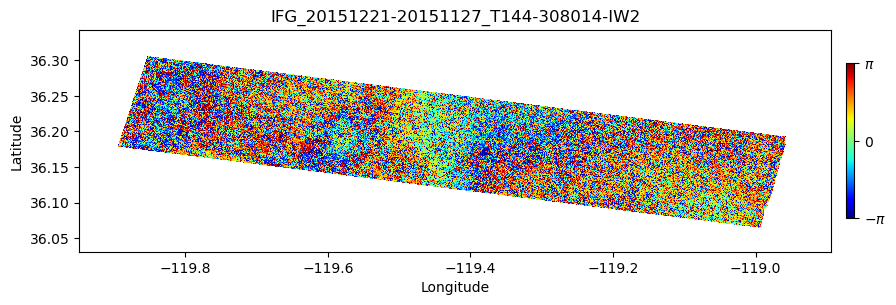

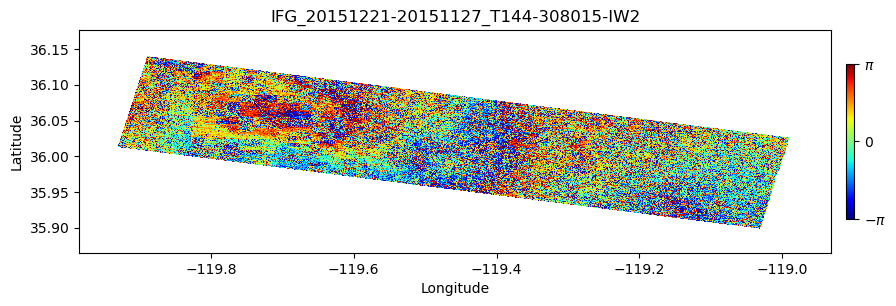

In [6]:
%matplotlib inline

for i, id in enumerate(burst_id):
    path_h5 = file_df[f'{id}'][30][:-1]
    xcoor, ycoor, dx, dy, epsg, bounding_polygon, orbit_direction = cslc_info(f'{data_dir}/{path_h5}/{path_h5}.h5')
    cslc_poly = wkt.loads(bounding_polygon)
    bbox = [cslc_poly.bounds[0], cslc_poly.bounds[2], cslc_poly.bounds[1], cslc_poly.bounds[3]]

    # Calculate burst-wise interferogram
    ifg = before[i] * np.conj(after[i])
    
    # Plot each interferogram
    fig, ax = plt.subplots(figsize=(10,3))
    cax = ax.imshow(colorize(np.angle(ifg), 'jet', -np.pi, np.pi), cmap='jet',interpolation='nearest', origin='upper',extent=bbox, vmin=-np.pi, vmax=np.pi)
    cbar = fig.colorbar(cax,orientation='vertical',fraction=0.01,pad=0.02)
    cbar.set_ticks([-np.pi, 0., np.pi])
    cbar.set_ticklabels([r'$-\pi$', '$0$', r'$\pi$'])
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(f'IFG_{dates[1]}-{dates[0]}_{id}',fontsize=12)

    # Save each interferogram as GeoTiff
    transform = from_origin(xcoor[0],ycoor[0],dx,np.abs(dy))
    rasterWrite(f'ifg_{id}.tif',np.angle(ifg),transform,epsg,dtype=rasterio.float32)
    
after = []; before=[]

In [6]:
src = rioxarray.open_rasterio(f'ifg_{burst_id[0]}.tif')
ifg1 = src.rio.reproject("EPSG:4326")[0]             # Folium maps are in EPSG:4326
ifg1 = ifg1.where(ifg1!=np.nan)
minlon,minlat,maxlon,maxlat = ifg1.rio.bounds()

# Downsample for folium visualization and attach RGBA color to numpy array
colored_ifg1 = colorize(ifg1[::6][::6], 'jet', -np.pi, np.pi)
# Define new bounding box
new_bbox1 = [minlon,maxlon,minlat,maxlat]

In [7]:
src = rioxarray.open_rasterio(f'ifg_{burst_id[1]}.tif')
ifg2 = src.rio.reproject("EPSG:4326")[0]             # Folium maps are in EPSG:4326
ifg2 = ifg2.where(ifg2!=np.nan)
minlon,minlat,maxlon,maxlat = ifg2.rio.bounds()

# Downsample for folium visualization and attach RGBA color to numpy array
colored_ifg2 = colorize(ifg2[::6][::6], 'jet', -np.pi, np.pi)
# Define new bounding box
new_bbox2 = [minlon,maxlon,minlat,maxlat]

In [8]:
# Read the merged raster file
src = rioxarray.open_rasterio('merged_old_new.tif')
merged_ifg = src.rio.reproject("EPSG:4326")[0]             # Folium maps are in EPSG:4326
minlon,minlat,maxlon,maxlat = merged_ifg.rio.bounds()

# Downsample for folium visualization and attach RGBA color to numpy array
colored_merged_ifg = colorize(merged_ifg[::6][::6], 'jet', -np.pi, np.pi)
# Define new bounding box
new_bbox = [minlon,maxlon,minlat,maxlat]

---


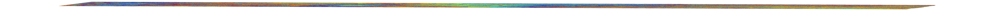
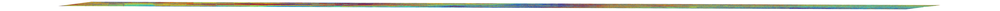
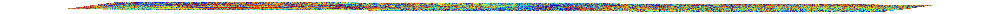

In [9]:
# Overlay merged bursts onto a basemap.

# Initialize Folium basemap and define center of mapview
xmid =(new_bbox1[0]+new_bbox1[1])/2 ; ymid = (new_bbox1[2]+new_bbox1[3])/2
m = folium.Map(location=[ymid, xmid], zoom_start=9, tiles='Stamen Terrain', show=True)

# Add custom basemaps
basemaps = getbasemaps()
for basemap in basemaps:
    basemaps[basemap].add_to(m)

# Overlay merged interferogram on a basemap
folium.raster_layers.ImageOverlay(colored_ifg1, 
                                        opacity=1.0, 
                                        bounds=[[new_bbox1[2],new_bbox1[0]],[new_bbox1[3],new_bbox1[1]]],
                                        interactive=False,
                                        name='ifg1',
                                        show=True).add_to(m)

# Include coherence as a layer
folium.raster_layers.ImageOverlay(colored_ifg2, 
                                        opacity=1.0, 
                                        bounds=[[new_bbox2[2],new_bbox2[0]],[new_bbox2[3],new_bbox2[1]]],
                                        interactive=False,
                                        name='ifg2',
                                        show=True).add_to(m)

# Overlay merged interferogram on a basemap
folium.raster_layers.ImageOverlay(colored_merged_ifg, 
                                        opacity=1.0, 
                                        bounds=[[new_bbox[2],new_bbox[0]],[new_bbox[3],new_bbox[1]]],
                                        interactive=False,
                                        name='merged',
                                        show=True).add_to(m)


#layer Control
m.add_child(folium.LayerControl())

# Add fullscreen button
plugins.Fullscreen().add_to(m)

#Add inset minimap image
minimap = plugins.MiniMap(width=300, height=300)
m.add_child(minimap)

#Mouse Position
fmtr = "function(num) {return L.Util.formatNum(num, 3) + ' º ';};"
plugins.MousePosition(position='bottomright', separator=' | ', prefix="Lat/Lon:",
                     lat_formatter=fmtr, lng_formatter=fmtr).add_to(m)

#Display
m